<a href="https://colab.research.google.com/github/Amirhossain959/geemap/blob/master/ndvi_change_estimate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import ee
import geemap as gee
import xarray as xr

In [3]:
!pip install xee
import xee

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 18.6 MB/s eta 0:00:00


In [6]:
ee.Authenticate()
ee.Initialize(project='roads-and-highways', opt_url='https://earthengine-highvolume.googleapis.com')

In [10]:
Map=gee.Map(basemap='ROADMAP')
Map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [96]:
roi=Map.draw_last_feature.geometry()

In [97]:
roi

ee.Geometry({
  "functionInvocationValue": {
    "functionName": "Feature.geometry",
    "arguments": {
      "feature": {
        "functionInvocationValue": {
          "functionName": "Feature",
          "arguments": {
            "geometry": {
              "functionInvocationValue": {
                "functionName": "GeometryConstructors.Polygon",
                "arguments": {
                  "coordinates": {
                    "constantValue": [
                      [
                        [
                          91.647658,
                          24.467151
                        ],
                        [
                          91.647658,
                          25.195
                        ],
                        [
                          92.534617,
                          25.195
                        ],
                        [
                          92.534617,
                          24.467151
                        ],
                        [
                          91.647658,
                          24.467151
                        ]
                      ]
                    ]
                  },
                  "geodesic": {
                    "constantValue": false
                  }
                }
              }
            }
          }
        }
      }
    }
  }
})

In [98]:
syl=ee.FeatureCollection("FAO/GAUL/2015/level2").filter(ee.Filter.eq('ADM2_NAME', 'Sylhet'))
syl

In [112]:
l8=ee.ImageCollection('LANDSAT/LC08/C02/T1_L2')
l9=ee.ImageCollection('LANDSAT/LC09/C02/T1_L2')
landsat=l8.merge(l9).filterDate('2013', '2026').filterBounds(syl).filter(ee.Filter.lt('CLOUD_COVER', 10))

In [113]:
landsat

In [114]:
def addNDVI(image):
    bands=image.select('SR.*').multiply(2.75e-05).add(-0.2)
    ndvi=bands.normalizedDifference(['SR_B5', 'SR_B4']).rename('NDVI')
    return ndvi.set('system:time_start', image.get('system:time_start'))

In [115]:
lan_ndvi=landsat.map(addNDVI)
lan_ndvi

In [116]:
ndvi_before=lan_ndvi.filterDate('2013', '2015').median().rename('NDVI_before')
ndvi_after=lan_ndvi.filterDate('2023', '2026').median().rename('NDVI_after')
ndvi_change=ndvi_before.subtract(ndvi_after).rename('NDVI_change')
ndvi_stack=ee.Image.cat([ndvi_before, ndvi_after, ndvi_change])
ndvi_stack


In [117]:
segmentation = ee.Algorithms.Image.Segmentation.SNIC(ndvi_stack).select('.*mean')
segmentation


In [118]:
def burned_area(img):
  thr=img.gt(0.3).selfMask()
  area=thr.multiply(ee.Image.pixelArea()).divide(1e6)
  return area


In [119]:
forest_lost=burned_area(segmentation.select('NDVI_change_mean'))
forest_lost

In [120]:
total_area=forest_lost.reduceRegion(reducer=ee.Reducer.sum(), geometry=syl, scale=30).values().getInfo()
total_area

[28.82718882012772]

In [121]:
ds=xr.open_dataset(segmentation, engine='ee', crs='EPSG:4326', geometry=roi, scale= 0.0003 )
ds

<xarray.Dataset> Size: 86MB
Dimensions:           (time: 1, lon: 2957, lat: 2426)
Coordinates:
  * time              (time) int64 8B 0
  * lon               (lon) float64 24kB 91.65 91.65 91.65 ... 92.53 92.53 92.53
  * lat               (lat) float64 19kB 24.47 24.47 24.47 ... 25.19 25.19 25.19
Data variables:
    NDVI_before_mean  (time, lon, lat) float32 29MB ...
    NDVI_after_mean   (time, lon, lat) float32 29MB ...
    NDVI_change_mean  (time, lon, lat) float32 29MB ...
Attributes:
    crs:      EPSG:4326

In [122]:
import matplotlib.pyplot as plt

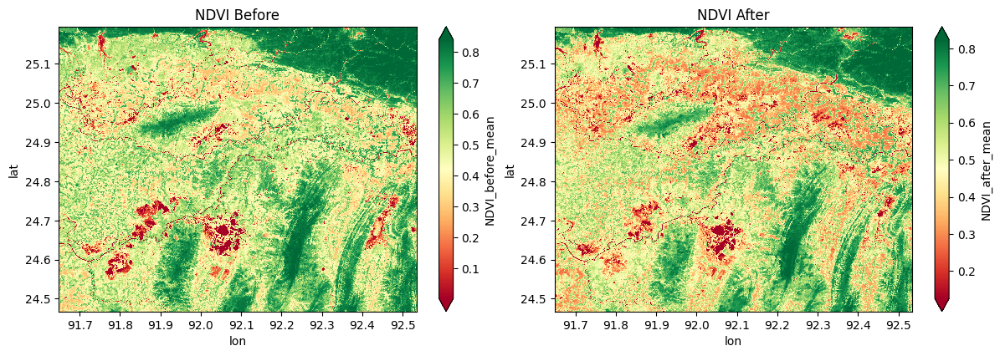

In [123]:
fig,ax=plt.subplots(1,2,figsize=(12,4))
plt.tight_layout()

ds.NDVI_before_mean.plot(ax=ax[0], x='lon', y='lat', robust=True, cmap='RdYlGn')
ds.NDVI_after_mean.plot(ax=ax[1], x='lon', y='lat', robust=True, cmap='RdYlGn')

ax[0].set_title('NDVI Before')
ax[1].set_title('NDVI After')

plt.savefig('ndvi_change.png', dpi=360, bbox_inches='tight' )

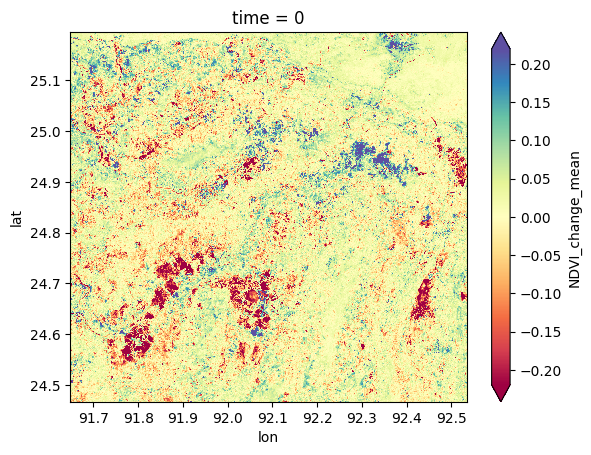

In [124]:
ds.NDVI_change_mean.plot(x='lon', y='lat', robust=True, cmap='Spectral')

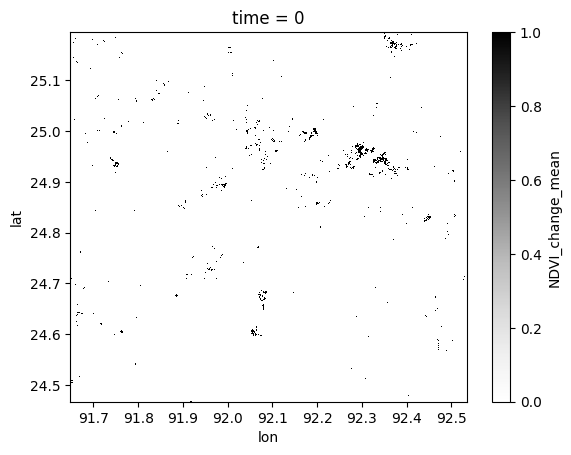

In [125]:
thr1=ds.NDVI_change_mean>0.3
thr1.plot(x='lon', y='lat', cmap='Greys')